**สร้าง Plane**

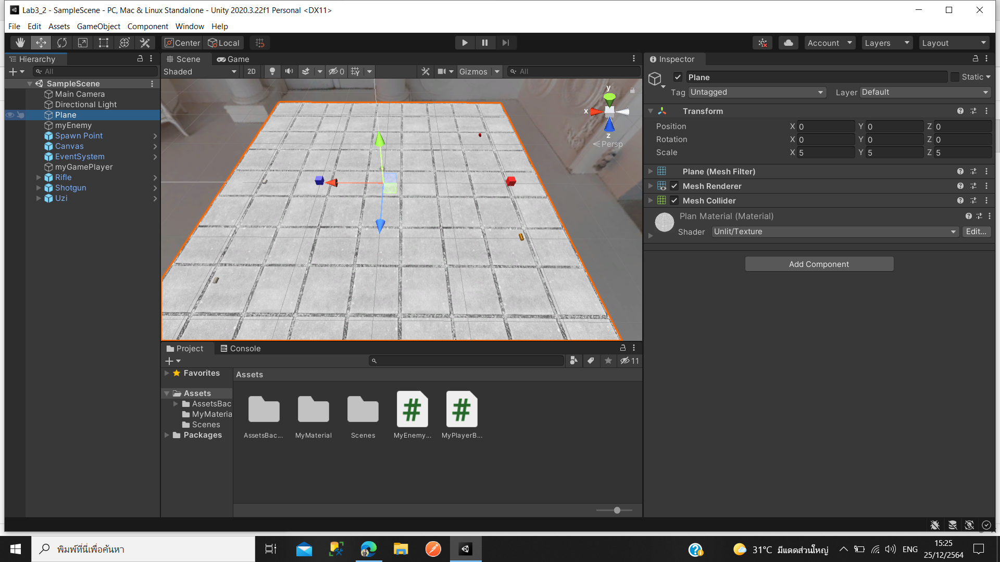

**เพิ่ม Event System**

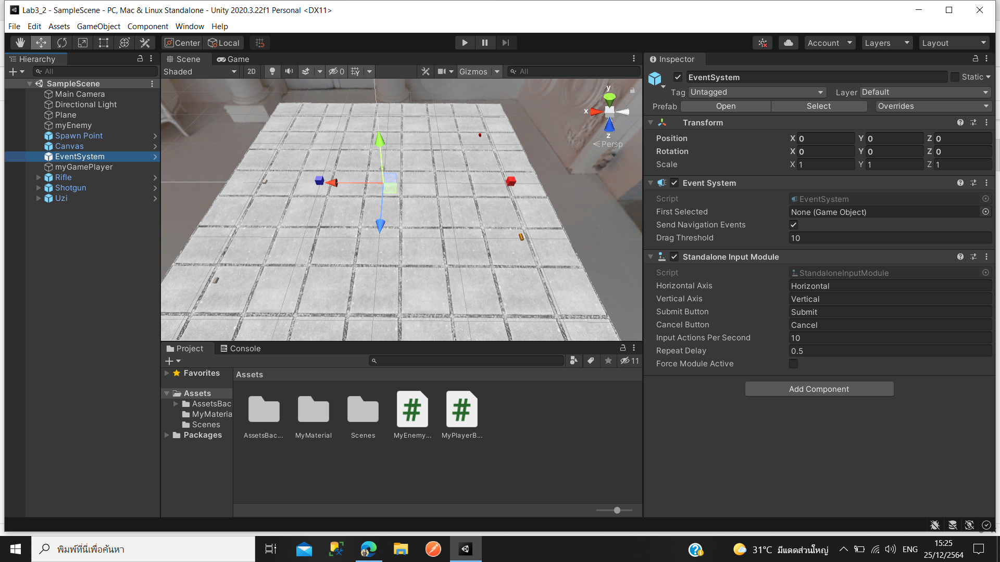

**เพิ่ม Canvas**

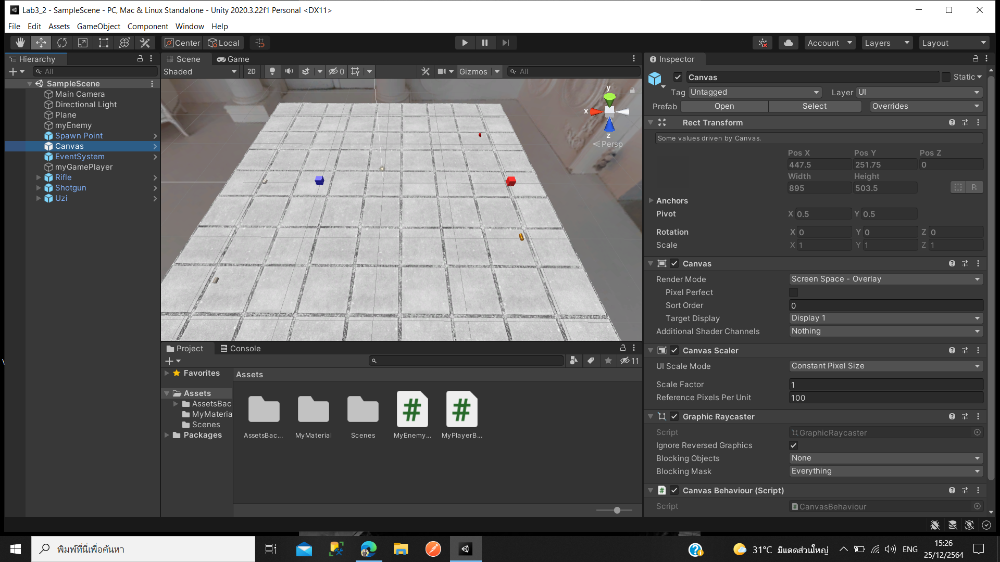

**การปรับมุมกล้อง**

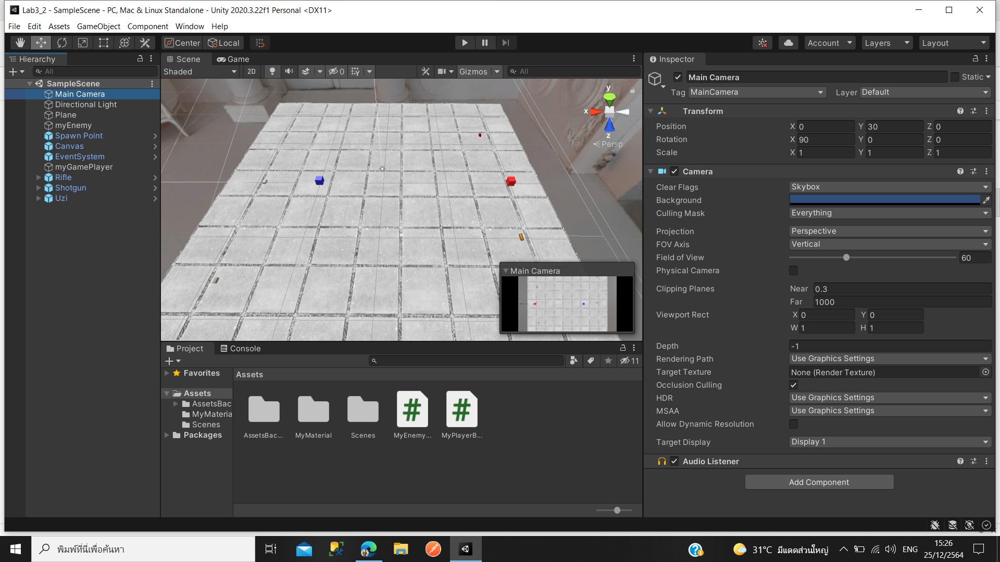

**การสร้าง Player**

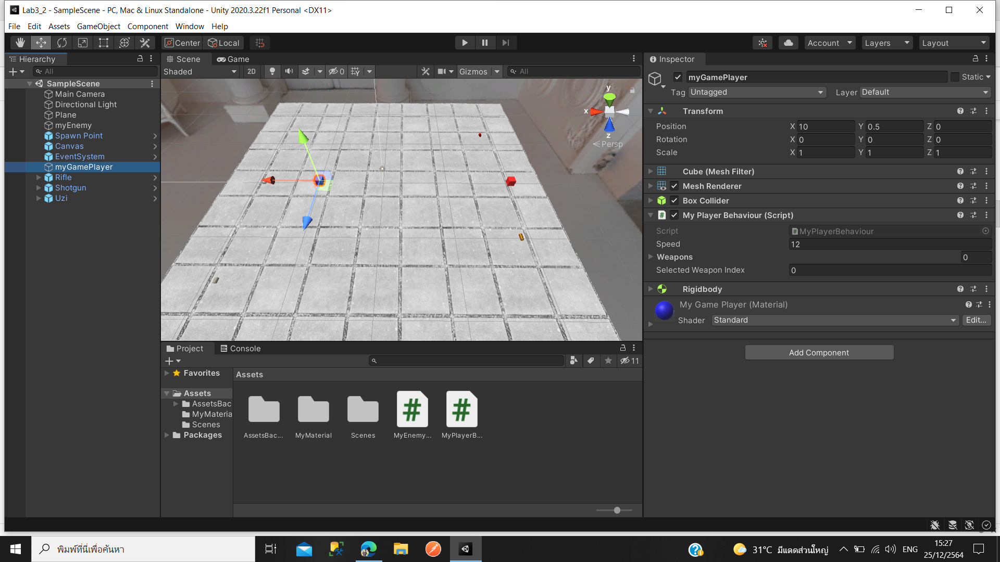

**การสร้าง PlayerBehaviour**

In [ ]:
using System.Collections;
using System.Collections.Generic;
using UnityEngine;

public static class References 
{
    public static GameObject thePlayer;
    public static GameObject canvas;
}

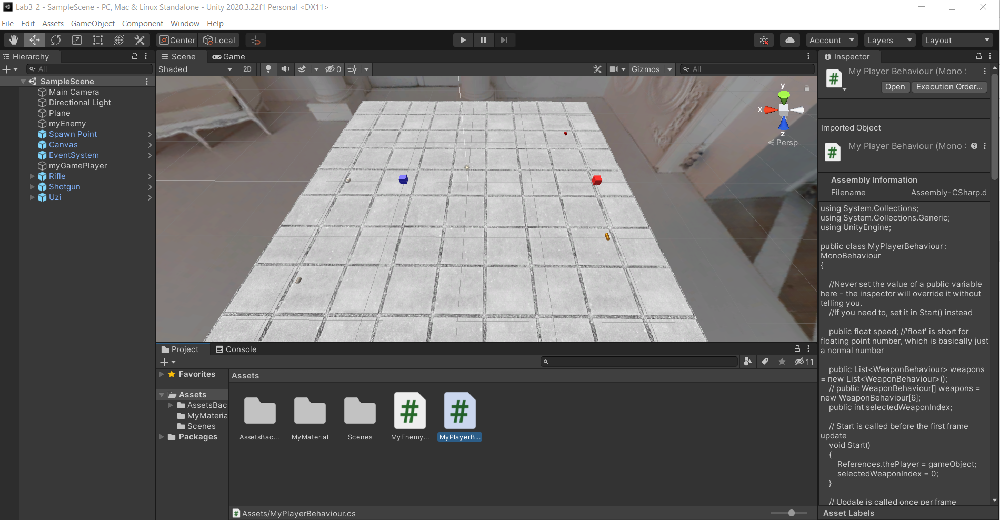

**ทำให้แท่นปืนเกิดการเคลื่อนที่**

In [ ]:
using System.Collections;
using System.Collections.Generic;
using UnityEngine;

public class PlayerBehaviour : MonoBehaviour
{

    //Never set the value of a public variable here - the inspector will override it without telling you.
    //If you need to, set it in Start() instead

    public float speed; //'float' is short for floating point number, which is basically just a normal number

    // Start is called before the first frame update
    void Start()
    {
        References.thePlayer = gameObject;
    }

    // Update is called once per frame
    void Update()
    {

        //การเคลื่อนที่ของแท่นปืน
        Vector3 inputVector = new Vector3(Input.GetAxis("Horizontal"), 0, Input.GetAxis("Vertical"));
        Rigidbody ourRigidBody = GetComponent<Rigidbody>();
        ourRigidBody.velocity = inputVector * speed;
    }
 }

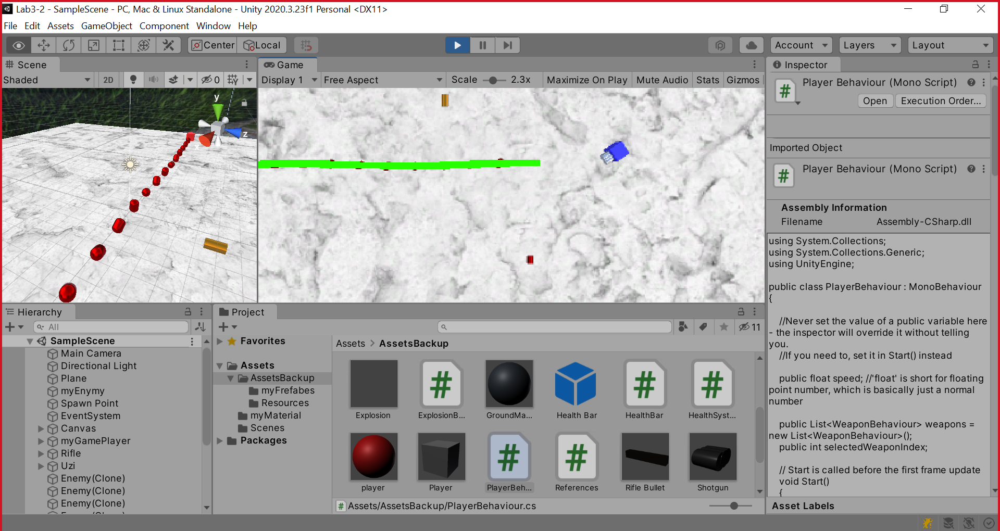

**ทำการหมุนแท่นปืนเป็นวงกลม**

In [ ]:
using System.Collections;
using System.Collections.Generic;
using UnityEngine;

public class PlayerBehaviour : MonoBehaviour
{

    //Never set the value of a public variable here - the inspector will override it without telling you.
    //If you need to, set it in Start() instead

    public float speed; //'float' is short for floating point number, which is basically just a normal number

    // Start is called before the first frame update
    void Start()
    {
        References.thePlayer = gameObject;
    }

    // Update is called once per frame
    void Update()
    {

        //การเคลื่อนที่ของแท่นปืน
        Vector3 inputVector = new Vector3(Input.GetAxis("Horizontal"), 0, Input.GetAxis("Vertical"));
        Rigidbody ourRigidBody = GetComponent<Rigidbody>();
        ourRigidBody.velocity = inputVector * speed;

        //การหมุนแท่นปืนเป็นวงกลม
        Ray rayFromCameraToCursor = Camera.main.ScreenPointToRay(Input.mousePosition);
        Plane playerPlane = new Plane(Vector3.up, transform.position);
        playerPlane.Raycast(rayFromCameraToCursor, out float distanceFromCamera);
        Vector3 cursorPosition = rayFromCameraToCursor.GetPoint(distanceFromCamera);
    }
 }

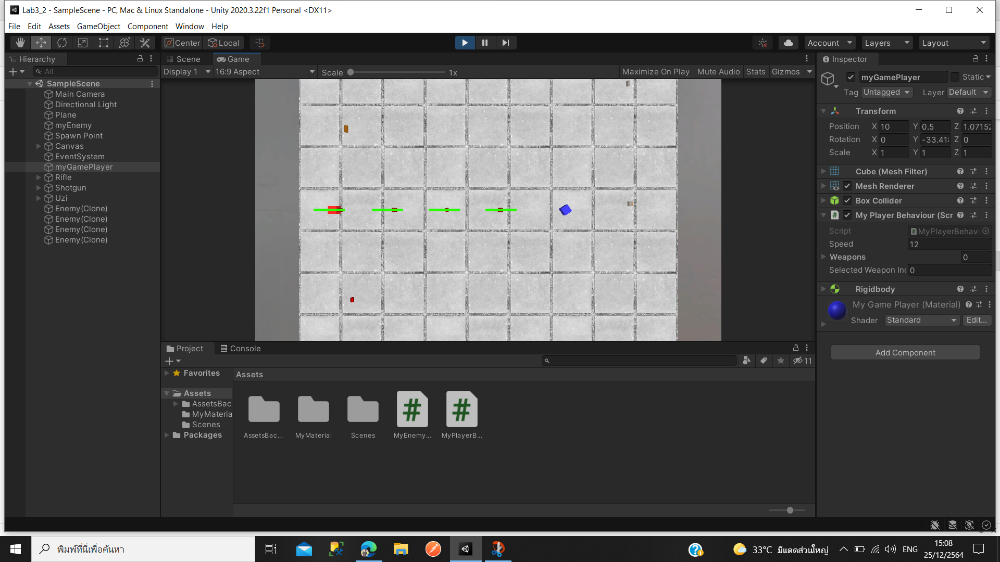

**ทำการเพิ่มอาวุธ**

In [ ]:
using System.Collections;
using System.Collections.Generic;
using UnityEngine;

public class PlayerBehaviour : MonoBehaviour
{

    //Never set the value of a public variable here - the inspector will override it without telling you.
    //If you need to, set it in Start() instead

    public float speed; //'float' is short for floating point number, which is basically just a normal number

    //สร้างตัวแปรเพื่อเก็บอาวุธ
    public List<WeaponBehaviour> weapons = new List<WeaponBehaviour>();
    //กำหนดตำแหน่งอาวุธ
    public int selectedWeaponIndex;

    // Start is called before the first frame update
    void Start()
    {
        References.thePlayer = gameObject;
        //กำหนดตำแหน่งแรกของอาวุธ
        selectedWeaponIndex = 0;
    }

    // Update is called once per frame
    void Update()
    {

        //การเคลื่อนที่ของแท่นปืน
        Vector3 inputVector = new Vector3(Input.GetAxis("Horizontal"), 0, Input.GetAxis("Vertical"));
        Rigidbody ourRigidBody = GetComponent<Rigidbody>();
        ourRigidBody.velocity = inputVector * speed;

        //การหมุนแท่นปืนเป็นวงกลม
        Ray rayFromCameraToCursor = Camera.main.ScreenPointToRay(Input.mousePosition);
        Plane playerPlane = new Plane(Vector3.up, transform.position);
        playerPlane.Raycast(rayFromCameraToCursor, out float distanceFromCamera);
        Vector3 cursorPosition = rayFromCameraToCursor.GetPoint(distanceFromCamera);
    }
 
    //เมื่อแท่นปืนชนเข้ากับอาวุธ
    private void OnTriggerEnter(Collider other)
    {
        WeaponBehaviour theirWeapon = other.GetComponentInParent<WeaponBehaviour>();
        if (theirWeapon != null)
        {
            //เพื่ออาวุธ
            weapons.Add(theirWeapon);
            //เปลี่ยนตำแหน่ง
            theirWeapon.transform.position = transform.position;
            theirWeapon.transform.rotation = transform.rotation;
            //เปลี่ยนให้อาวุธเป็นผู้ติดตาม
            theirWeapon.transform.SetParent(transform);
        }
    }
 }

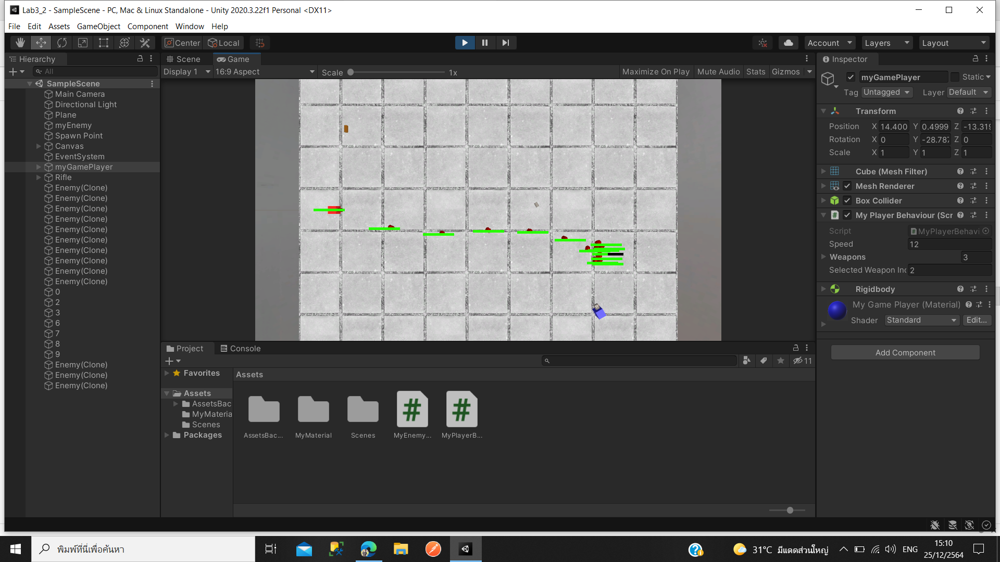

**กำหนดให้ยิงปืน**

In [ ]:
using System.Collections;
using System.Collections.Generic;
using UnityEngine;

public class PlayerBehaviour : MonoBehaviour
{

    //Never set the value of a public variable here - the inspector will override it without telling you.
    //If you need to, set it in Start() instead

    public float speed; //'float' is short for floating point number, which is basically just a normal number

    //สร้างตัวแปรเพื่อเก็บอาวุธ
    public List<WeaponBehaviour> weapons = new List<WeaponBehaviour>();
    //กำหนดตำแหน่งอาวุธ
    public int selectedWeaponIndex;

    // Start is called before the first frame update
    void Start()
    {
        References.thePlayer = gameObject;
        //กำหนดตำแหน่งแรกของอาวุธ
        selectedWeaponIndex = 0;
    }

    // Update is called once per frame
    void Update()
    {

        //การเคลื่อนที่ของแท่นปืน
        Vector3 inputVector = new Vector3(Input.GetAxis("Horizontal"), 0, Input.GetAxis("Vertical"));
        Rigidbody ourRigidBody = GetComponent<Rigidbody>();
        ourRigidBody.velocity = inputVector * speed;

        //การหมุนแท่นปืนเป็นวงกลม
        Ray rayFromCameraToCursor = Camera.main.ScreenPointToRay(Input.mousePosition);
        Plane playerPlane = new Plane(Vector3.up, transform.position);
        playerPlane.Raycast(rayFromCameraToCursor, out float distanceFromCamera);
        Vector3 cursorPosition = rayFromCameraToCursor.GetPoint(distanceFromCamera);
     
        //กำหนดให้กดปุ่มเม้าซ้ายยิงปืน
        if (weapons.Count > 0 && Input.GetButton("Fire1"))
        {
            //Tell our weapon to fire
            weapons[selectedWeaponIndex].Fire(cursorPosition);
        }
    }
 
    //เมื่อแท่นปืนชนเข้ากับอาวุธ
    private void OnTriggerEnter(Collider other)
    {
        WeaponBehaviour theirWeapon = other.GetComponentInParent<WeaponBehaviour>();
        if (theirWeapon != null)
        {
            //เพื่ออาวุธ
            weapons.Add(theirWeapon);
            //เปลี่ยนตำแหน่ง
            theirWeapon.transform.position = transform.position;
            theirWeapon.transform.rotation = transform.rotation;
            //เปลี่ยนให้อาวุธเป็นผู้ติดตาม
            theirWeapon.transform.SetParent(transform);
        }
    }
 }

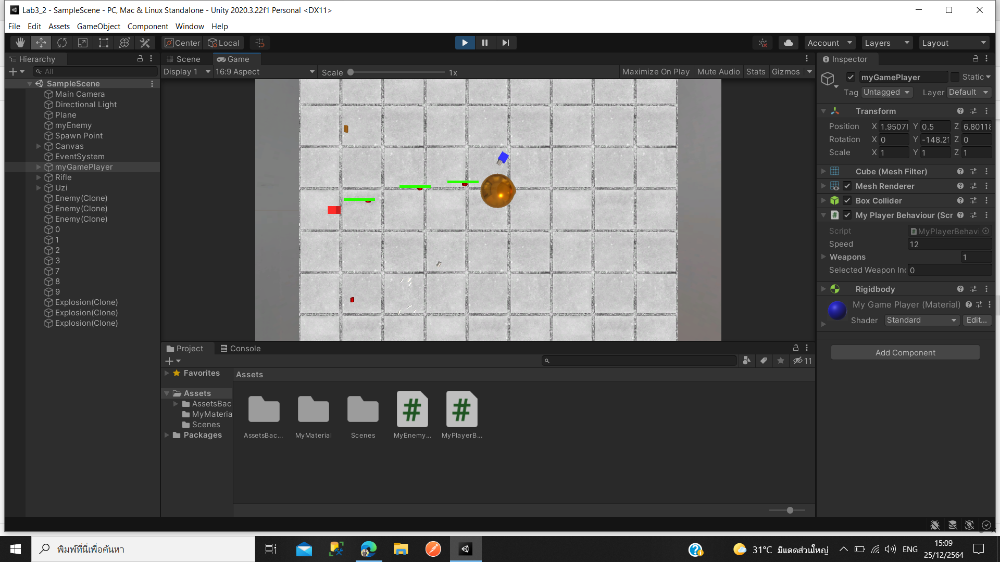

**การเพิ่ม Enermy ลงไปในเกมส์**

In [ ]:
using System.Collections;
using System.Collections.Generic;
using UnityEngine;

public class EnemySpawner : MonoBehaviour
{

    public GameObject spawnPoint;
    public GameObject enemyPrefab;
    public float secondsBetweenSpawns;
    float secondsSinceLastSpawn;

    // Start is called before the first frame update
    void Start()
    {
        secondsSinceLastSpawn = 0;
    }

    //Fixed update happens the same number of times for all players, so it's a good place for gameplay critical things.
    private void FixedUpdate()
    {
        secondsSinceLastSpawn += Time.fixedDeltaTime;
        if (secondsSinceLastSpawn >= secondsBetweenSpawns)
        {
            Instantiate(enemyPrefab, spawnPoint.transform.position, spawnPoint.transform.rotation);
            secondsSinceLastSpawn = 0;
        }
    }
}

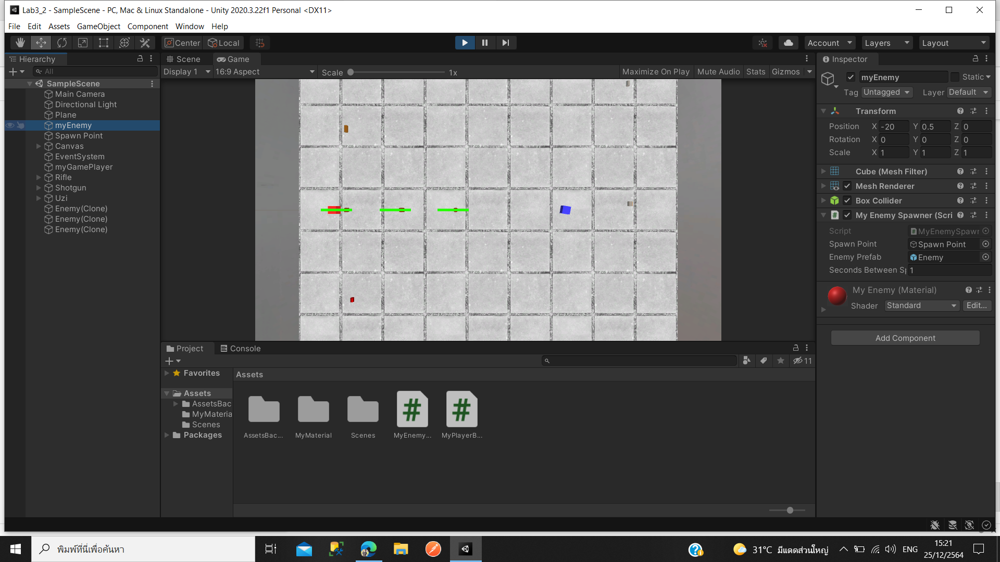